 # Modeling Preprocessing


### Load the data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import matplotlib.dates as mdates

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)
%matplotlib inline

Settings for getting figures in high resolution

In [2]:
# sns.set(rc={"figure.dpi": 300, 'savefig.dpi': 300})
# sns.set_context('notebook')
# sns.set_style("ticks")

In [3]:
df=pd.read_pickle('./dataset_/dataset_cleaned_popularity.pkl')
df.drop(columns=['index', 'level_0'], inplace=True)  # Comes from pickeling the file
df.reset_index(drop=True, inplace=True)

In [4]:
df.head()

,country,uri,popularity,title,artist,release_type,sub_genre,artist_followers,explicit,album,release_date,track_number,tracks_in_album,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveness,valence,tempo,time_signature,genre,days_since_release,released_after_2017,explicit_false,explicit_true,popu_max,top10_dummy,top50_dummy,cluster,duration_min,release_year,release_month,release_day
0,Global,https://open.spotify.com/track/6FyRXC8tJUh863J...,31833.95,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,10,1.0,1.0,global,4.31065,2018,11,5
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,191,0.0,0.0,english speaking and nordic,4.31065,2018,11,5
2,Argentina,https://open.spotify.com/track/6FyRXC8tJUh863J...,76924.40,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5
3,Belgium,https://open.spotify.com/track/6FyRXC8tJUh863J...,849.60,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,126,0.0,0.0,english speaking and nordic,4.31065,2018,11,5
4,Switzerland,https://open.spotify.com/track/6FyRXC8tJUh863J...,20739.10,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,21,0.0,1.0,english speaking and nordic,4.31065,2018,11,5


## Missing Data Overview and Imbalance of Genre

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166681 entries, 0 to 166680
Data columns (total 38 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   country              166681 non-null  object 
 1   uri                  166681 non-null  object 
 2   popularity           166681 non-null  float64
 3   title                166681 non-null  object 
 4   artist               166681 non-null  object 
 5   release_type         166681 non-null  object 
 6   sub_genre            166681 non-null  object 
 7   artist_followers     166681 non-null  float64
 8   explicit             166681 non-null  object 
 9   album                166681 non-null  object 
 10  release_date         166681 non-null  object 
 11  track_number         166681 non-null  object 
 12  tracks_in_album      166681 non-null  object 
 13  danceability         166681 non-null  float64
 14  energy               166681 non-null  float64
 15  key              

In [6]:
plt.figure(figsize=(12, 8))
sns.countplot(y=y, data=df)

NameError: name 'y' is not defined

<Figure size 864x576 with 0 Axes>

We have a severe imbalance of labels that can cause problems for modeling. In our case the imbalance is due to property of the problem domain. Our genres are sampled from the countries top200 playlists and therefore are not uniformly distributed. Some genres are simply more popular then others and have therefore a higher count in the dataset.  |

In [9]:
df['genre'].value_counts()

pop                 60020
hip hop             35805
rap                 13562
latin                9675
indie                7339
rock                 6337
dance/electronic     5751
else                 4819
house                4713
k-pop                4526
r&b/soul             4510
metal                2364
boy band             1983
trap                 1682
funk                 1052
reggaeton            1001
country               700
opm                   360
bolero                212
reggae                136
jazz                  134
Name: genre, dtype: int64

Its still a problem, because the model will have a harder time to learn the caracteristics of the classes that have fewer samples then the ones that are majority classes. We will decide later what to do. 

In [10]:
df.isnull().sum()

country                0
uri                    0
popularity             0
title                  0
artist                 0
release_type           0
sub_genre              0
artist_followers       0
explicit               0
album                  0
release_date           0
track_number           0
tracks_in_album        0
danceability           0
energy                 0
key                    0
loudness               0
mode                   0
speechiness            0
acoustics              0
instrumentalness       0
liveness               0
valence                0
tempo                  0
time_signature         0
genre                  0
days_since_release     0
released_after_2017    0
explicit_false         0
explicit_true          0
popu_max               0
top10_dummy            0
top50_dummy            0
cluster                0
duration_min           0
release_year           0
release_month          0
release_day            0
dtype: int64

## First Part of Feature Engineering

In [9]:
df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')

In [10]:
df.columns

Index(['country', 'uri', 'popularity', 'title', 'artist', 'release_type',
       'sub_genre', 'artist_followers', 'explicit', 'album', 'release_date',
       'track_number', 'tracks_in_album', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acoustics', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'genre',
       'days_since_release', 'released_after_2017', 'explicit_false',
       'explicit_true', 'popu_max', 'top10_dummy', 'top50_dummy', 'cluster',
       'duration_min', 'release_year', 'release_month', 'release_day'],
      dtype='object')

In [11]:
# Feature Engineering with date column
df['day_of_week'] = df['release_date'].dt.day_of_week
df['day_of_year'] = df['release_date'].dt.day_of_year
df[['release_date', 'days_since_release', 'released_after_2017', 'release_year', 'release_month', 'release_day', 'day_of_week', 'day_of_year']].head(10)

,release_date,days_since_release,released_after_2017,release_year,release_month,release_day,day_of_week,day_of_year
0,2018-11-05,740.0,1.0,2018,11,5,0,309
1,2018-11-05,740.0,1.0,2018,11,5,0,309
2,2018-11-05,740.0,1.0,2018,11,5,0,309
3,2018-11-05,740.0,1.0,2018,11,5,0,309
4,2018-11-05,740.0,1.0,2018,11,5,0,309
5,2018-11-05,740.0,1.0,2018,11,5,0,309
6,2018-11-05,740.0,1.0,2018,11,5,0,309
7,2018-11-05,740.0,1.0,2018,11,5,0,309
8,2018-11-05,740.0,1.0,2018,11,5,0,309
9,2018-11-05,740.0,1.0,2018,11,5,0,309


In [12]:
df.head(10)

,country,uri,popularity,title,artist,release_type,sub_genre,artist_followers,explicit,album,release_date,track_number,tracks_in_album,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveness,valence,tempo,time_signature,genre,days_since_release,released_after_2017,explicit_false,explicit_true,popu_max,top10_dummy,top50_dummy,cluster,duration_min,release_year,release_month,release_day,day_of_week,day_of_year
0,Global,https://open.spotify.com/track/6FyRXC8tJUh863J...,31833.95,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,10,1.0,1.0,global,4.31065,2018,11,5,0,309
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,191,0.0,0.0,english speaking and nordic,4.31065,2018,11,5,0,309
2,Argentina,https://open.spotify.com/track/6FyRXC8tJUh863J...,76924.40,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5,0,309
3,Belgium,https://open.spotify.com/track/6FyRXC8tJUh863J...,849.60,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,126,0.0,0.0,english speaking and nordic,4.31065,2018,11,5,0,309
4,Switzerland,https://open.spotify.com/track/6FyRXC8tJUh863J...,20739.10,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,21,0.0,1.0,english speaking and nordic,4.31065,2018,11,5,0,309
5,Chile,https://open.spotify.com/track/6FyRXC8tJUh863J...,60264.20,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5,0,309
6,Colombia,https://open.spotify.com/track/6FyRXC8tJUh863J...,60131.15,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,2,1.0,1.0,spanish speaking,4.31065,2018,11,5,0,309
7,Costa Rica,https://open.spotify.com/track/6FyRXC8tJUh863J...,64081.30,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5,0,309
8,Germany,https://open.spotify.com/track/6FyRXC8tJUh863J...,208.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,180,0.0,0.0,english speaking and nordic,4.31065,2018,11,5,0,309
9,Ecuador,https://open.spotify.com/track/6FyRXC8tJUh863J...,75636.90,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5,0,309


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166681 entries, 0 to 166680
Data columns (total 40 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   country              166681 non-null  object        
 1   uri                  166681 non-null  object        
 2   popularity           166681 non-null  float64       
 3   title                166681 non-null  object        
 4   artist               166681 non-null  object        
 5   release_type         166681 non-null  object        
 6   sub_genre            166681 non-null  object        
 7   artist_followers     166681 non-null  float64       
 8   explicit             166681 non-null  object        
 9   album                166681 non-null  object        
 10  release_date         166681 non-null  datetime64[ns]
 11  track_number         166681 non-null  object        
 12  tracks_in_album      166681 non-null  object        
 13  danceability  

In [11]:
# What to do with track_number and track_in_album?

df = df.astype({'top10_dummy': int, 'top50_dummy': int, 'released_after_2017': int, 'days_since_release': int,
               'track_number': int, 'tracks_in_album': int, 'key': int, 'mode': int, 'time_signature': int, 'artist_followers': int})


- Int values are categorical values that are already transformed
- Float values are numerical values 
- Object values are categorical values that still need to be encoded

In [12]:
numerics = ['popularity', 'artist_followers', 'danceability', 'energy', 'loudness', 'speechiness', 'acoustics',	'instrumentalness',	'liveness',	'valence',	'tempo', 'duration_min']
numeric_df = df[numerics]
numeric_df.sample(5)

,popularity,artist_followers,danceability,energy,loudness,speechiness,acoustics,instrumentalness,liveness,valence,tempo,duration_min
71554,123.20,4214973,0.747,0.643,-6.991,0.1780,0.07560,0.008940,0.3550,0.538,99.981,2.460433
27369,12.80,18426467,0.512,0.754,-6.031,0.0549,0.13500,0.000000,0.0881,0.336,147.890,3.361550
10765,890.10,5004777,0.529,0.871,-5.831,0.1550,0.11800,0.000164,0.1150,0.272,189.837,3.331117
75617,16.80,10919803,0.813,0.808,-5.541,0.2860,0.00693,0.000000,0.1330,0.547,181.993,3.202200
102949,7447.75,62981,0.911,0.708,-3.439,0.0888,0.05920,0.000000,0.0567,0.555,107.014,2.908867


In [15]:
numeric_df.describe().apply(lambda s: s.apply('{0:.2f}'.format))


,popularity,artist_followers,danceability,energy,loudness,speechiness,acoustics,instrumentalness,liveness,valence,tempo,duration_min
count,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00,166681.00
mean,5511.37,8712254.25,0.67,0.64,-6.53,0.12,0.24,0.01,0.18,0.49,120.97,3.45
std,13236.83,13137401.61,0.14,0.17,2.61,0.12,0.25,0.09,0.14,0.22,28.84,0.84
min,0.80,12.00,0.00,0.00,-43.99,0.00,0.00,0.00,0.01,0.00,0.00,0.50
25%,78.40,441044.00,0.58,0.54,-7.68,0.04,0.05,0.00,0.10,0.32,98.00,2.99
50%,530.40,2945049.00,0.68,0.66,-6.11,0.07,0.15,0.00,0.12,0.49,119.93,3.38
75%,3995.05,12263746.00,0.77,0.77,-4.82,0.17,0.37,0.00,0.21,0.66,140.01,3.81
max,233766.90,71783101.00,0.98,1.00,1.63,0.95,0.99,0.99,0.99,0.99,230.27,60.90


### Compare different Scaling Methods:

In [17]:
# Normalization
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaled_numeric_X = scaler.fit_transform(numeric_df)
scaled_numeric_X_min_max = pd.DataFrame(scaled_numeric_X, columns=numeric_df.columns)
scaled_numeric_X_min_max.describe()

,popularity,artist_followers,danceability,energy,loudness,speechiness,acoustics,instrumentalness,liveness,valence,tempo,duration_min
count,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000
mean,0.023573,0.121369,0.679051,0.641967,0.821127,0.129789,0.242380,0.014330,0.168060,0.497324,0.525330,0.048825
std,0.056624,0.183015,0.147201,0.172589,0.057253,0.122078,0.248765,0.087221,0.139715,0.224599,0.125243,0.013864
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000332,0.006144,0.587996,0.537789,0.795844,0.044921,0.045727,0.000000,0.085180,0.325581,0.425592,0.041185
50%,0.002266,0.041027,0.695829,0.661112,0.830192,0.075183,0.151757,0.000000,0.113472,0.491405,0.520841,0.047633
75%,0.017087,0.170844,0.785351,0.769396,0.858511,0.176963,0.368843,0.000039,0.202329,0.669363,0.608012,0.054735
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [18]:
# Standardization
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_numeric_X = scaler.fit_transform(numeric_df)
scaled_numeric_X_standard = pd.DataFrame(scaled_numeric_X, columns=numeric_df.columns)
scaled_numeric_X_standard.describe()


,popularity,artist_followers,danceability,energy,loudness,speechiness,acoustics,instrumentalness,liveness,valence,tempo,duration_min
count,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05,1.666810e+05
mean,4.107874e-16,3.165200e-14,-8.013833e-17,6.421024e-16,5.928161e-16,-1.787276e-16,-1.812968e-15,-8.242757e-15,3.184840e-16,-3.940289e-16,-1.045893e-15,5.438806e-16
std,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00
min,-4.163068e-01,-6.631653e-01,-4.613108e+00,-3.719644e+00,-1.434212e+01,-1.063166e+00,-9.743357e-01,-1.642935e-01,-1.202878e+00,-2.214281e+00,-4.194513e+00,-3.521603e+00
25%,-4.104443e-01,-6.295944e-01,-6.185809e-01,-6.036222e-01,-4.415944e-01,-6.951921e-01,-7.905190e-01,-1.642935e-01,-5.932046e-01,-7.646663e-01,-7.963658e-01,-5.510205e-01
50%,-3.762971e-01,-4.389926e-01,1.139795e-01,1.109285e-01,1.583319e-01,-4.473027e-01,-3.642910e-01,-1.642935e-01,-3.907110e-01,-2.635337e-02,-3.584745e-02,-8.597139e-02
75%,-1.145531e-01,2.703352e-01,7.221429e-01,7.383388e-01,6.529743e-01,3.864292e-01,5.083653e-01,-1.638428e-01,2.452797e-01,7.659824e-01,6.601761e-01,4.262693e-01
max,1.724402e+01,4.800876e+00,2.180353e+00,2.074490e+00,3.124272e+00,7.128335e+00,3.045533e+00,1.130092e+01,5.954576e+00,2.238106e+00,3.790011e+00,6.860578e+01


In [19]:
# Standardization
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
scaled_numeric_X = scaler.fit_transform(numeric_df)
scaled_numeric_X_robust = pd.DataFrame(scaled_numeric_X, columns=numeric_df.columns)
scaled_numeric_X_robust.describe()


,popularity,artist_followers,danceability,energy,loudness,speechiness,acoustics,instrumentalness,liveness,valence,tempo,duration_min
count,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000,166681.000000
mean,1.271741,0.487808,-0.085013,-0.082661,-0.144652,0.413548,0.280465,364.521925,0.465973,0.017217,0.024611,0.087969
std,3.379631,1.111201,0.745868,0.745180,0.913605,0.924541,0.769894,2218.731003,1.192632,0.653320,0.686560,1.023241
min,-0.135218,-0.249100,-3.525773,-2.854459,-13.247639,-0.569389,-0.469668,0.000000,-0.968614,-1.429412,-2.855164,-3.515468
25%,-0.115405,-0.211796,-0.546392,-0.532468,-0.548094,-0.229183,-0.328149,0.000000,-0.241500,-0.482353,-0.522140,-0.475856
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.884595,0.788204,0.453608,0.467532,0.451906,0.770817,0.671851,1.000000,0.758500,0.517647,0.477860,0.524144
max,59.549998,5.822531,1.541237,1.463203,2.709689,7.003965,2.625194,25438.144330,7.567568,1.479412,2.626672,70.287998


Text(0.5, 1.0, 'RobustScaler')

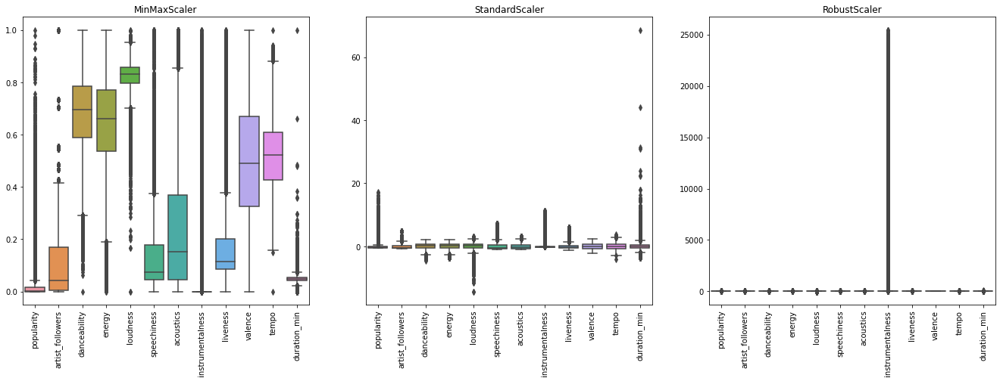

In [20]:
f, axes = plt.subplots(1, 3, figsize=(23, 7))
sns.boxplot(data=scaled_numeric_X_min_max, ax=axes[0])
sns.boxplot(data=scaled_numeric_X_standard, ax=axes[1])
sns.boxplot(data=scaled_numeric_X_robust, ax=axes[2])

axes[0].tick_params(axis='x', rotation=90)
axes[0].set_title('MinMaxScaler')
axes[1].tick_params(axis='x', rotation=90)
axes[1].set_title('StandardScaler')
axes[2].tick_params(axis='x', rotation=90)
axes[2].set_title('RobustScaler')


Minmax Scaler look most promising but some features like popularity, insturmentalness and duration_min still need further transformation to follow a similar scale as the other features. At first we do a benchmark and test these 3 methods against each other by creating a simple classifier. 

In [20]:
y = df['genre']
df.drop(columns=['genre'], inplace=True)
df.reset_index(drop=True, inplace=True)

In [21]:
y

0         hip hop
1         hip hop
2         hip hop
3         hip hop
4         hip hop
           ...   
166676        pop
166677        pop
166678        pop
166679      indie
166680        rap
Name: genre, Length: 166681, dtype: object

In [22]:
# 60, 20, 20 Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    scaled_numeric_X_min_max, y, test_size=0.2, random_state=1)

X_train_1, X_val_1, y_train_1, y_val_1 = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [23]:
# 60, 20, 20 Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    scaled_numeric_X_standard, y, test_size=0.2, random_state=1)

X_train_2, X_val_2, y_train_2, y_val_2 = train_test_split(
    X_train, y_train, test_size=0.25, random_state=1)


In [24]:
# 60, 20, 20 Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    scaled_numeric_X_robust, y, test_size=0.2, random_state=1)

X_train_3, X_val_3, y_train_3, y_val_3 = train_test_split(
    X_train, y_train, test_size=0.25, random_state=1)


#### Logistic Regression Benchmark 

In [25]:
from sklearn.linear_model import LogisticRegression

lr1 = LogisticRegression()
lr1_model = lr1.fit(X_train_1, y_train_1)

lr2 = LogisticRegression()
lr2_model = lr2.fit(X_train_2, y_train_2)

lr3 = LogisticRegression()
lr3_model = lr3.fit(X_train_3, y_train_3)


In [46]:
from sklearn.metrics import classification_report

def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    report = classification_report(test_labels, predictions)
    print('Model Performance')
    print(report)
    return predictions


In [27]:
lr1_predictions = evaluate(lr1_model, X_val_1, y_val_1)

Model Performance
                  precision    recall  f1-score   support

          bolero       0.00      0.00      0.00        43
        boy band       0.00      0.00      0.00       401
         country       0.00      0.00      0.00       142
dance/electronic       0.08      0.00      0.00      1173
            else       0.38      0.03      0.05       949
            funk       0.00      0.00      0.00       221
         hip hop       0.51      0.63      0.56      7060
           house       0.29      0.02      0.04       907
           indie       0.04      0.00      0.00      1461
            jazz       0.00      0.00      0.00        31
           k-pop       0.00      0.00      0.00       924
           latin       0.43      0.06      0.10      1991
           metal       0.36      0.24      0.29       480
             opm       0.00      0.00      0.00        84
             pop       0.45      0.88      0.59     12016
        r&b/soul       0.00      0.00      0.00      

In [28]:
lr2_predictions = evaluate(lr2_model, X_val_2, y_val_2)


Model Performance
                  precision    recall  f1-score   support

          bolero       0.00      0.00      0.00        43
        boy band       0.00      0.00      0.00       401
         country       0.00      0.00      0.00       142
dance/electronic       0.05      0.00      0.00      1173
            else       0.38      0.03      0.05       949
            funk       0.00      0.00      0.00       221
         hip hop       0.51      0.63      0.56      7060
           house       0.36      0.03      0.05       907
           indie       0.06      0.00      0.00      1461
            jazz       0.00      0.00      0.00        31
           k-pop       0.21      0.00      0.01       924
           latin       0.44      0.13      0.20      1991
           metal       0.41      0.30      0.35       480
             opm       0.50      0.02      0.05        84
             pop       0.46      0.87      0.60     12016
        r&b/soul       0.00      0.00      0.00      

In [29]:
lr3_predictions = evaluate(lr3_model, X_val_3, y_val_3)

Model Performance
                  precision    recall  f1-score   support

          bolero       0.00      0.00      0.00        43
        boy band       0.00      0.00      0.00       401
         country       0.00      0.00      0.00       142
dance/electronic       0.00      0.00      0.00      1173
            else       0.11      0.00      0.00       949
            funk       0.00      0.00      0.00       221
         hip hop       0.50      0.46      0.48      7060
           house       0.50      0.00      0.00       907
           indie       0.00      0.00      0.00      1461
            jazz       0.00      0.00      0.00        31
           k-pop       0.00      0.00      0.00       924
           latin       0.16      0.00      0.01      1991
           metal       0.00      0.00      0.00       480
             opm       0.00      0.00      0.00        84
             pop       0.42      0.92      0.57     12016
        r&b/soul       0.00      0.00      0.00      

In the case of Logistic Regression we can see that the scaling matters a lot. In our case the StandardScaler performed the best with 47% Accuracy. 

### Random Forest

Decision Trees and Random Forest should be invariant to scaling.

In [30]:
from sklearn.ensemble import RandomForestClassifier

rf1 = RandomForestClassifier(n_estimators=50)
rf1_model = rf1.fit(X_train_1, y_train_1)

rf2 = RandomForestClassifier(n_estimators=50)
rf2_model = rf2.fit(X_train_2, y_train_2)

rf3 = RandomForestClassifier(n_estimators=50)
rf3_model = rf3.fit(X_train_3, y_train_3)


In [38]:
print('MinMax Scaler')
rf1_predictions = evaluate(rf1_model, X_val_1, y_val_1)

MinMax Scaler
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.77      0.87        43
        boy band       1.00      0.93      0.97       401
         country       1.00      0.68      0.81       142
dance/electronic       0.99      0.75      0.85      1173
            else       0.93      0.49      0.64       949
            funk       0.98      0.62      0.76       221
         hip hop       0.79      0.93      0.85      7060
           house       0.99      0.89      0.93       907
           indie       0.96      0.51      0.67      1461
            jazz       1.00      0.19      0.32        31
           k-pop       0.98      0.89      0.94       924
           latin       0.96      0.85      0.90      1991
           metal       0.95      0.93      0.94       480
             opm       1.00      0.04      0.07        84
             pop       0.83      0.95      0.89     12016
        r&b/soul       1.00      0.84  

In [36]:
print('Standard Scaler')
rf2_predictions = evaluate(rf2_model, X_val_2, y_val_2)

Standard Scaler
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.81      0.90        43
        boy band       1.00      0.93      0.97       401
         country       1.00      0.68      0.81       142
dance/electronic       0.99      0.75      0.85      1173
            else       0.94      0.48      0.64       949
            funk       0.99      0.60      0.75       221
         hip hop       0.79      0.92      0.85      7060
           house       0.99      0.89      0.93       907
           indie       0.95      0.49      0.65      1461
            jazz       1.00      0.19      0.32        31
           k-pop       0.98      0.89      0.93       924
           latin       0.96      0.85      0.90      1991
           metal       0.96      0.93      0.94       480
             opm       0.80      0.05      0.09        84
             pop       0.83      0.95      0.89     12016
        r&b/soul       1.00      0.84

In [37]:
print('Robust Scaler')
rf3_predictions = evaluate(rf3_model, X_val_3, y_val_3)

Robust Scaler
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.79      0.88        43
        boy band       1.00      0.93      0.97       401
         country       0.99      0.70      0.82       142
dance/electronic       0.98      0.76      0.86      1173
            else       0.91      0.49      0.64       949
            funk       0.98      0.61      0.75       221
         hip hop       0.79      0.92      0.85      7060
           house       0.99      0.89      0.94       907
           indie       0.94      0.50      0.65      1461
            jazz       1.00      0.19      0.32        31
           k-pop       0.98      0.90      0.94       924
           latin       0.96      0.85      0.90      1991
           metal       0.95      0.92      0.94       480
             opm       1.00      0.02      0.05        84
             pop       0.83      0.95      0.89     12016
        r&b/soul       1.00      0.84  

The assumption that Random Forest is invariant to scaling is true. All classifiers with perform more or less the same with our 3 different scalers. 

In [34]:
rf1.classes_

array(['bolero', 'boy band', 'country', 'dance/electronic', 'else',
       'funk', 'hip hop', 'house', 'indie', 'jazz', 'k-pop', 'latin',
       'metal', 'opm', 'pop', 'r&b/soul', 'rap', 'reggae', 'reggaeton',
       'rock', 'trap'], dtype=object)

<AxesSubplot:>

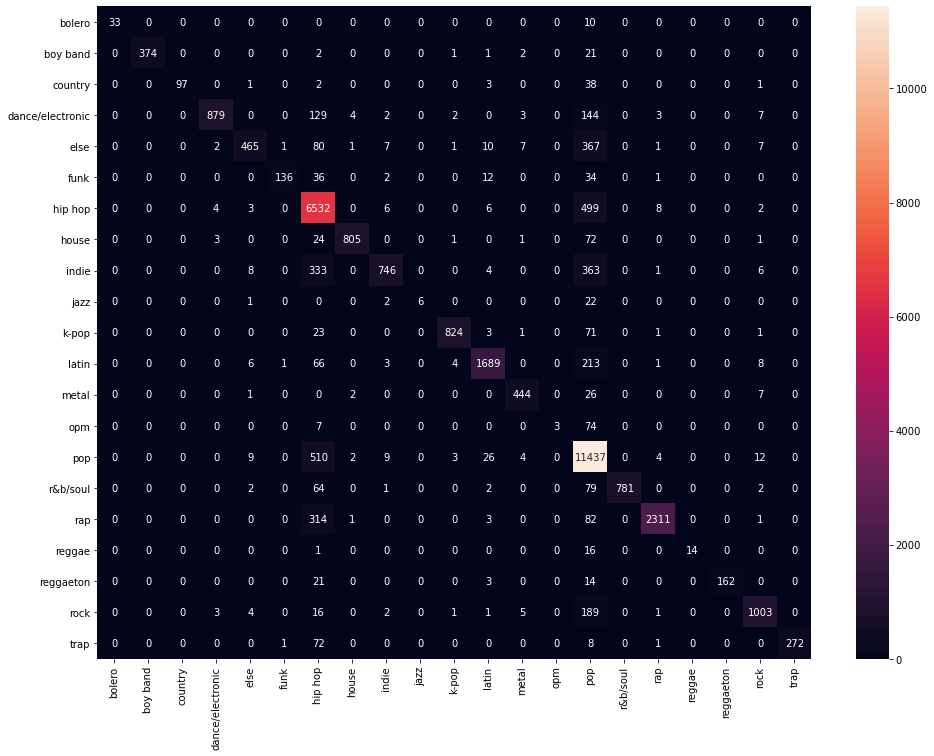

In [35]:
from sklearn.metrics import confusion_matrix

cm1 = confusion_matrix(y_val_1, rf1_predictions)
plt.figure(figsize=(16, 12))
sns.heatmap(cm1, annot=True,  xticklabels=rf1.classes_, yticklabels=rf1.classes_ ,fmt='g')


### Hyperparamter Tuning for random forest

In [ ]:
# Number of trees in random forest
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start=200, stop=1000, num=100)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]  # Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf4 = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation,
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator=rf4, param_distributions=random_grid, n_iter=100,
                               cv=3, verbose=2, random_state=42, n_jobs=-1)  # Fit the random search model
rf_random.fit(X_train_1, y_train_1)


In [ ]:
rf_random.best_params_

In [39]:
base_model = RandomForestClassifier(n_estimators = 10, random_state = 42)
base_model.fit(X_train_1, y_train_1)
evaluate(base_model, X_val_1, y_val_1)

Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.74      0.85        43
        boy band       0.98      0.94      0.96       401
         country       0.90      0.66      0.76       142
dance/electronic       0.88      0.76      0.81      1173
            else       0.72      0.51      0.59       949
            funk       0.92      0.60      0.72       221
         hip hop       0.78      0.92      0.84      7060
           house       0.95      0.89      0.92       907
           indie       0.78      0.51      0.62      1461
            jazz       1.00      0.19      0.32        31
           k-pop       0.96      0.88      0.92       924
           latin       0.93      0.84      0.88      1991
           metal       0.93      0.91      0.92       480
             opm       0.57      0.05      0.09        84
             pop       0.85      0.92      0.88     12016
        r&b/soul       0.99      0.83      0.90      

array(['pop', 'pop', 'pop', ..., 'dance/electronic', 'r&b/soul', 'pop'],
      dtype=object)

In [ ]:
tuned_model = RandomForestClassifier(n_estimators=500, max_features='sqrt', bootstrap=False, random_state=42)
tuned_model.fit(X_train_1, y_train_1)
evaluate(tuned_model, X_val_1, y_val_1)


In [ ]:
# With tuned hyperparameters

evaluate(rf_random.best_estimator_, X_val_1, y_val_1)


### Decision Trees

In [42]:
# Try Decision Tree as Benchmark   
from sklearn.tree import DecisionTreeClassifier

dt1 = DecisionTreeClassifier()
dt1 = dt1.fit(X_train_1, y_train_1)

In [43]:
# Decision Tree model
evaluate(dt1, X_val_1, y_val_1)

Model Performance
                  precision    recall  f1-score   support

          bolero       0.84      0.84      0.84        43
        boy band       0.93      0.94      0.93       401
         country       0.71      0.72      0.72       142
dance/electronic       0.76      0.77      0.77      1173
            else       0.56      0.52      0.54       949
            funk       0.63      0.62      0.63       221
         hip hop       0.83      0.82      0.83      7060
           house       0.85      0.87      0.86       907
           indie       0.61      0.61      0.61      1461
            jazz       0.31      0.16      0.21        31
           k-pop       0.89      0.89      0.89       924
           latin       0.85      0.84      0.85      1991
           metal       0.90      0.89      0.90       480
             opm       0.30      0.17      0.21        84
             pop       0.87      0.88      0.87     12016
        r&b/soul       0.85      0.86      0.86      

array(['pop', 'pop', 'pop', ..., 'dance/electronic', 'r&b/soul', 'pop'],
      dtype=object)

In [44]:
genres = list(dt1.classes_)
genres[15] = 'r_and_b/soul'

In [ ]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(dt1, out_file=None, 
                           feature_names=list(
                               scaled_numeric_X_min_max.columns),
                     class_names=genres,  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

### PCA & TSNE Analysis

In [45]:
from sklearn.decomposition import PCA

pca = PCA()
components = pca.fit_transform(X_train_1)

In [46]:
columns=[f'pc {i}' for i in range(components.shape[1])]
principalDf = pd.DataFrame(data=components, columns=columns)
principalDf.reset_index(drop=True, inplace=True)
y_train_1.reset_index(drop=True, inplace=True)
principalDf= pd.concat([principalDf, y_train_1], axis=1)
principalDf

,pc 0,pc 1,pc 2,pc 3,pc 4,pc 5,pc 6,pc 7,pc 8,pc 9,pc 10,pc 11,genre
0,0.855195,0.116478,-0.123607,0.125452,-0.057835,-0.158534,0.028012,0.089102,-0.051111,-0.015155,0.021778,-0.001945,country
1,-0.028600,-0.321129,-0.121360,0.017297,-0.124158,-0.142786,-0.047829,0.088679,-0.030712,-0.013876,0.018977,0.014347,pop
2,0.053919,-0.254310,-0.168674,0.117877,-0.152784,0.061078,-0.159386,0.100890,-0.048072,-0.007464,-0.024246,0.007747,indie
3,-0.026944,0.390414,-0.004399,-0.108854,0.086613,-0.020785,0.152368,0.074900,0.004882,0.205362,-0.004846,0.038857,rap
4,-0.470461,0.258852,-0.079067,0.364541,0.121624,-0.069434,-0.104125,-0.045025,-0.005332,-0.025495,0.038105,-0.007375,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100003,-0.389044,0.046768,0.439947,0.097335,0.029224,0.112010,-0.017179,-0.011214,0.005748,-0.035485,-0.024595,0.012768,hip hop
100004,0.045585,0.013247,0.020360,-0.180800,0.033175,-0.086506,-0.155630,-0.027668,-0.019707,-0.025091,-0.036070,0.000609,pop
100005,-0.158997,0.288839,-0.005048,-0.099509,-0.037280,-0.024582,0.016545,0.025933,-0.004221,0.094656,-0.026336,0.011732,indie
100006,0.172390,0.084633,-0.070949,-0.034684,0.015010,-0.058311,-0.048817,-0.116223,-0.028887,-0.006534,-0.080152,-0.005592,hip hop


In [47]:
pca.explained_variance_ratio_

array([0.3263043 , 0.18777997, 0.1265851 , 0.08747118, 0.06965018,
       0.06282631, 0.05058984, 0.04213597, 0.02901342, 0.01202341,
       0.00491494, 0.00070538])

In [48]:
pca.explained_variance_ratio_.cumsum()

array([0.3263043 , 0.51408427, 0.64066937, 0.72814055, 0.79779073,
       0.86061704, 0.91120688, 0.95334285, 0.98235627, 0.99437967,
       0.99929462, 1.        ])

<AxesSubplot:xlabel='pc 0', ylabel='pc 1'>

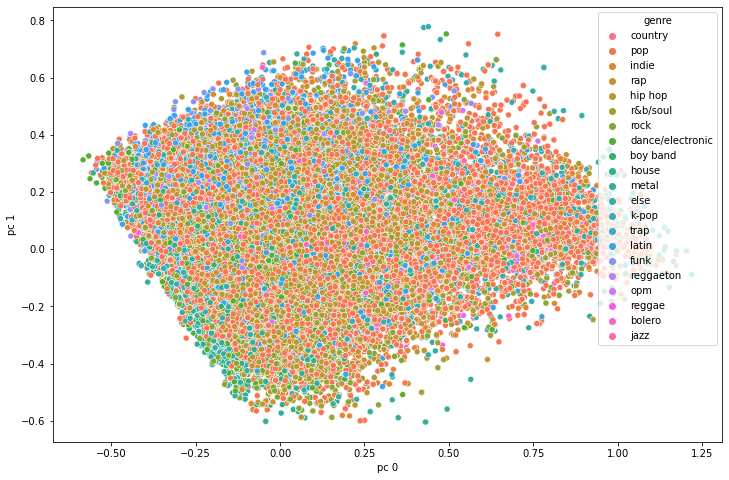

In [49]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x=principalDf.iloc[:, 0], y=principalDf.iloc[:, 1], hue=principalDf['genre'])

In [50]:
import plotly.express as px

def plot3d(df3, title, clus_lab):
    """Visual 3d DR method with cluster or labels
    Parameters:
    df3 (Dataframe): name_changed dataframe with descriptor, cluster and labels
    title (string): tiles name
    clus_lab (string): select cluster or labels as keyword 
    """    
    fig = px.scatter_3d(df3, x=df3.iloc[:, 0], y=df3.iloc[:, 1], z=df3.iloc[:, 2],
                        color=clus_lab, title=title, labels=df3.columns[:3],
                        color_discrete_sequence=px.colors.qualitative.Dark24)
    
    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000,
        )
    fig.show()


In [51]:
plot3d(principalDf.iloc[:, :3], 'Spread of the first 3 PC', principalDf['genre'])

In [212]:
# Try the same with tsne methods
from sklearn.manifold import TSNE

tsne = TSNE(n_components=3, perplexity=100)  # # comp. takes a long time
tsne_result = tsne.fit_transform(X_train_1)

In [55]:
import joblib
joblib.dump(tsne_result, './models/tnse2d_benchmark.pkl')

['./models/tnse2d_benchmark.pkl']

In [214]:
columns=[f'tsne comp. {i}' for i in range(tsne_result.shape[1])]
tsne_Df = pd.DataFrame(data=tsne_result, columns=columns)
tsne_Df.reset_index(drop=True, inplace=True)
y_train_1.reset_index(drop=True, inplace=True)
tsne_Df = pd.concat([tsne_Df, y_train_1], axis=1)
tsne_Df

,tsne comp. 0,tsne comp. 1,tsne comp. 2,genre
0,-9.574241,13.785690,-13.723372,country
1,-0.188826,-18.056801,14.520830,pop
2,-14.855777,7.378795,-6.774077,indie
3,8.164875,-0.681564,-4.024724,rap
4,-4.511440,1.470020,16.062113,pop
...,...,...,...,...
100003,18.263693,11.401874,7.983664,hip hop
100004,-5.225031,-8.821615,-6.135488,pop
100005,-3.299406,9.504525,-2.039057,indie
100006,1.645428,6.764307,-10.635083,hip hop


<AxesSubplot:xlabel='tsne comp. 0', ylabel='tsne comp. 1'>

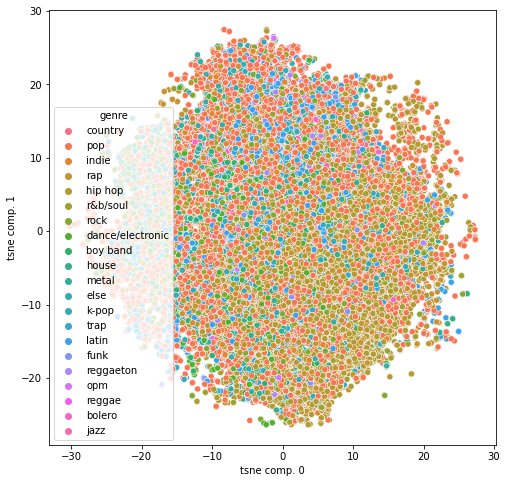

In [215]:
plt.figure(figsize=(8, 8))
sns.scatterplot(data=tsne_Df, x='tsne comp. 0', y='tsne comp. 1', hue='genre')

In [216]:
plot3d(tsne_Df, 'Spread of the first 3 TSNE Components', tsne_Df['genre'])


### Encoding of the categorical features

### Createing a ML Pipeline 


In [197]:
df = pd.read_pickle('./dataset_/dataset_cleaned_popularity.pkl')
# Comes from pickeling the file
df.drop(columns=['index', 'level_0'], inplace=True)
df.reset_index(drop=True, inplace=True)

In [198]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

In [199]:
df.head(5)

,country,uri,popularity,title,artist,release_type,sub_genre,artist_followers,explicit,album,release_date,track_number,tracks_in_album,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveness,valence,tempo,time_signature,genre,days_since_release,released_after_2017,explicit_false,explicit_true,popu_max,top10_dummy,top50_dummy,cluster,duration_min,release_year,release_month,release_day
0,Global,https://open.spotify.com/track/6FyRXC8tJUh863J...,31833.95,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,10,1.0,1.0,global,4.31065,2018,11,5
1,USA,https://open.spotify.com/track/6FyRXC8tJUh863J...,8.00,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,191,0.0,0.0,english speaking and nordic,4.31065,2018,11,5
2,Argentina,https://open.spotify.com/track/6FyRXC8tJUh863J...,76924.40,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,1,1.0,1.0,spanish speaking,4.31065,2018,11,5
3,Belgium,https://open.spotify.com/track/6FyRXC8tJUh863J...,849.60,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,126,0.0,0.0,english speaking and nordic,4.31065,2018,11,5
4,Switzerland,https://open.spotify.com/track/6FyRXC8tJUh863J...,20739.10,adan y eva,Paulo Londra,single,argentine hip hop,11427104.0,False,Adan y Eva,2018-11-05,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,hip hop,740.0,1.0,1,0,21,0.0,1.0,english speaking and nordic,4.31065,2018,11,5


In [200]:
df.columns

Index(['country', 'uri', 'popularity', 'title', 'artist', 'release_type',
       'sub_genre', 'artist_followers', 'explicit', 'album', 'release_date',
       'track_number', 'tracks_in_album', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acoustics', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'genre',
       'days_since_release', 'released_after_2017', 'explicit_false',
       'explicit_true', 'popu_max', 'top10_dummy', 'top50_dummy', 'cluster',
       'duration_min', 'release_year', 'release_month', 'release_day'],
      dtype='object')

In [201]:
# What to do with track_number and track_in_album?

df = df.astype({'top10_dummy': int, 'top50_dummy': int, 'released_after_2017': int, 'days_since_release': int,
               'track_number': int, 'tracks_in_album': int, 'key': int, 'mode': int, 'time_signature': int})


In [202]:
# Drop columns that have no influence for the prediciton of genre or are already outsourced by feature engineering
df.drop(columns=['release_date', 
                 'uri',
                 'explicit_true',
                 'explicit_false',
                #  'title',
                #  'artist',
                #  'album', 
                 'sub_genre', # First try without 
                 ], inplace=True)
df.reset_index(drop=True, inplace=True)

In [203]:
df['explicit'] = df['explicit'].replace({'True': 1, 'False': 0})
df["explicit"] = df["explicit"].astype(int)

In [204]:
y = df['genre']
df.drop(columns=['genre'], inplace=True)
df.reset_index(drop=True, inplace=True)


In [205]:
df.head(5)

,country,popularity,title,artist,release_type,artist_followers,explicit,album,track_number,tracks_in_album,danceability,energy,key,loudness,mode,speechiness,acoustics,instrumentalness,liveness,valence,tempo,time_signature,days_since_release,released_after_2017,popu_max,top10_dummy,top50_dummy,cluster,duration_min,release_year,release_month,release_day
0,Global,31833.95,adan y eva,Paulo Londra,single,11427104.0,0,Adan y Eva,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,740,1,10,1,1,global,4.31065,2018,11,5
1,USA,8.00,adan y eva,Paulo Londra,single,11427104.0,0,Adan y Eva,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,740,1,191,0,0,english speaking and nordic,4.31065,2018,11,5
2,Argentina,76924.40,adan y eva,Paulo Londra,single,11427104.0,0,Adan y Eva,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,740,1,1,1,1,spanish speaking,4.31065,2018,11,5
3,Belgium,849.60,adan y eva,Paulo Londra,single,11427104.0,0,Adan y Eva,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,740,1,126,0,0,english speaking and nordic,4.31065,2018,11,5
4,Switzerland,20739.10,adan y eva,Paulo Londra,single,11427104.0,0,Adan y Eva,1,1,0.767,0.709,1,-4.47,1,0.336,0.323,0.0,0.0676,0.72,171.993,4,740,1,21,0,1,english speaking and nordic,4.31065,2018,11,5


In [206]:
numeric_features = ['popularity', 'artist_followers', 'danceability', 'energy', 
                    'loudness', 'speechiness', 'acoustics', 'instrumentalness', 
                    'liveness', 'valence', 'tempo', 'duration_min']

In [207]:
# categorical features that still need encoding
categorical_features = ['country', 
                        # 'title',  # Drop
                        'artist', # Drop
                        'release_type',
                        # 'sub_genre',  # Drop or keep, probably too much info 
                        'album',  # Drop
                        'cluster']

In [208]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

In [209]:
numeric_transformer = MinMaxScaler()
                                      

In [210]:
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

In [211]:
preprocessor = ColumnTransformer(
    transformers=[('num', numeric_transformer, numeric_features), 
                  ('cat', categorical_transformer, categorical_features)]
)

In [212]:
pipe = Pipeline(steps=[('preprocessor', preprocessor), 
                        ('classifier', DecisionTreeClassifier())])

In [213]:
from sklearn import set_config

set_config(display='diagram')

In [214]:
train_ratio = 0.70
validation_ratio = 0.15
test_ratio = 0.15

# train is now 75% of the entire data set
# the _junk suffix means that we drop that variable completely
x_train, x_test, y_train, y_test = train_test_split(df, y, test_size= 1 - train_ratio, stratify=y)


In [215]:
# If you want to have a validation set

# test is now 10% of the initial data set
# validation is now 15% of the initial data set
x_val, x_test, y_val, y_test = train_test_split(
    x_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio), stratify=y_test)


In [216]:
pipe.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'artist',
                                                   'release_type', 'album',
                                                   'cluster'])])),
                ('classifier', DecisionTreeClassifier())])

In [194]:
x_train.shape

(116676, 32)

In [164]:
print("KNN Classifier Model:")
predictions = evaluate(pipe, x_val, y_val)
pipe

KNN Classifier Model:
Model Performance
                  precision    recall  f1-score   support

          bolero       0.94      1.00      0.97        32
        boy band       0.91      0.99      0.95       298
         country       0.85      0.80      0.82       105
dance/electronic       0.89      0.86      0.88       862
            else       0.85      0.67      0.75       723
            funk       0.85      0.77      0.80       158
         hip hop       0.93      0.96      0.94      5371
           house       0.90      0.84      0.87       707
           indie       0.94      0.85      0.89      1101
            jazz       0.67      0.30      0.41        20
           k-pop       0.96      0.97      0.96       679
           latin       0.92      0.95      0.93      1451
           metal       0.96      0.98      0.97       354
             opm       0.85      0.72      0.78        54
             pop       0.92      0.96      0.94      9003
        r&b/soul       0.98    

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'artist',
                                                   'release_type', 'album',
                                                   'cluster'])])),
                ('classifier', KNeighborsClassifier())])

In [167]:
pipe.feature_names_in_

array(['country', 'popularity', 'title', 'artist', 'release_type',
       'artist_followers', 'explicit', 'album', 'track_number',
       'tracks_in_album', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acoustics', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'days_since_release',
       'released_after_2017', 'popu_max', 'top10_dummy', 'top50_dummy',
       'cluster', 'duration_min', 'release_year', 'release_month',
       'release_day'], dtype=object)

In [195]:
print("Logistic Regression Classifier Model:")
predictions = evaluate(pipe, x_val, y_val)
pipe

Logistic Regression Classifier Model:
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.97      0.98        32
        boy band       1.00      0.89      0.94       298
         country       0.97      0.67      0.79       105
dance/electronic       0.98      0.77      0.86       862
            else       0.95      0.60      0.74       723
            funk       0.75      0.80      0.77       158
         hip hop       0.90      0.96      0.93      5371
           house       0.98      0.79      0.87       707
           indie       0.95      0.81      0.87      1101
            jazz       1.00      0.25      0.40        20
           k-pop       1.00      0.94      0.97       679
           latin       0.90      0.92      0.91      1451
           metal       0.98      0.94      0.96       354
             opm       0.69      0.94      0.80        54
             pop       0.89      0.98      0.93      9003
        r&b/sou

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'artist',
                                                   'release_type', 'album',
                                                   'cluster'])])),
                ('classifier', LogisticRegression())])

In [217]:
print("Decision Tree Classifier Model:")
predictions = evaluate(pipe, x_val, y_val)
pipe


Decision Tree Classifier Model:
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.94      0.97        32
        boy band       0.97      0.95      0.96       298
         country       0.81      0.76      0.78       105
dance/electronic       0.80      0.74      0.77       862
            else       0.60      0.50      0.54       723
            funk       0.74      0.63      0.68       158
         hip hop       0.86      0.89      0.87      5371
           house       0.86      0.83      0.85       707
           indie       0.74      0.72      0.73      1101
            jazz       0.42      0.40      0.41        20
           k-pop       0.90      0.91      0.91       679
           latin       0.90      0.88      0.89      1451
           metal       0.91      0.91      0.91       354
             opm       0.66      0.61      0.63        54
             pop       0.87      0.89      0.88      9003
        r&b/soul     

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'artist',
                                                   'release_type', 'album',
                                                   'cluster'])])),
                ('classifier', DecisionTreeClassifier())])

Text(118.109375, 0.5, 'True Label')

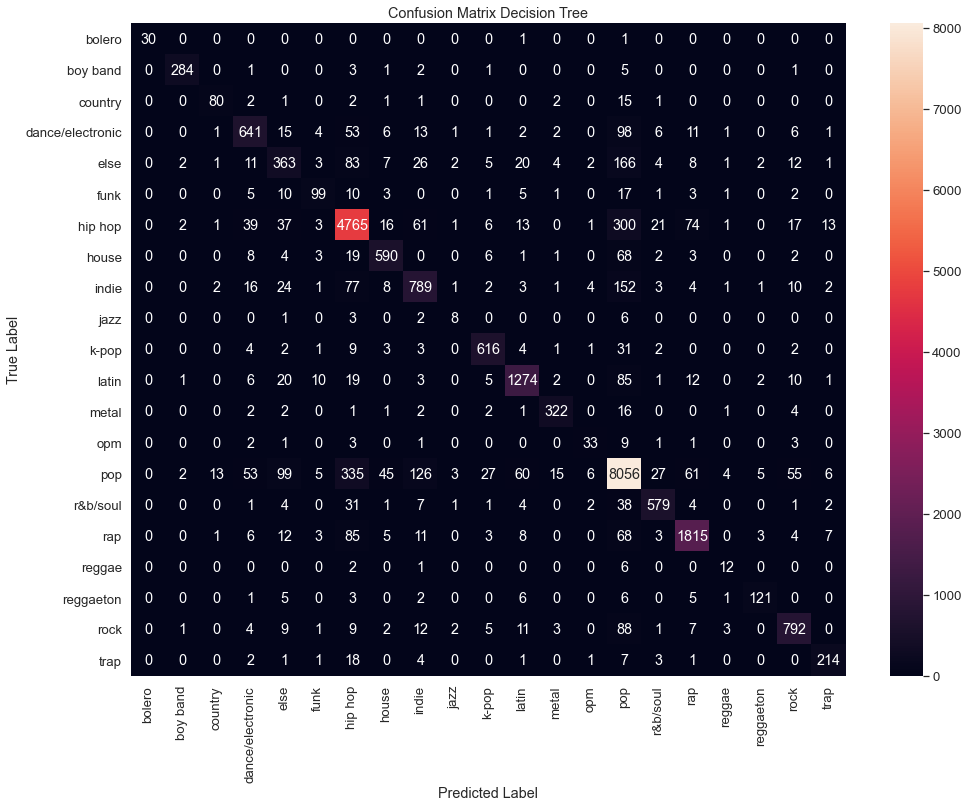

In [236]:
from sklearn.metrics import confusion_matrix
sns.set(font_scale=1.2)

cm1 = confusion_matrix(y_val, predictions)
plt.figure(figsize=(16, 12))
ax = sns.heatmap(cm1, annot=True,  xticklabels=pipe['classifier'].classes_, yticklabels=pipe['classifier'].classes_ ,fmt='g')
ax.set_title('Confusion Matrix Decision Tree')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')

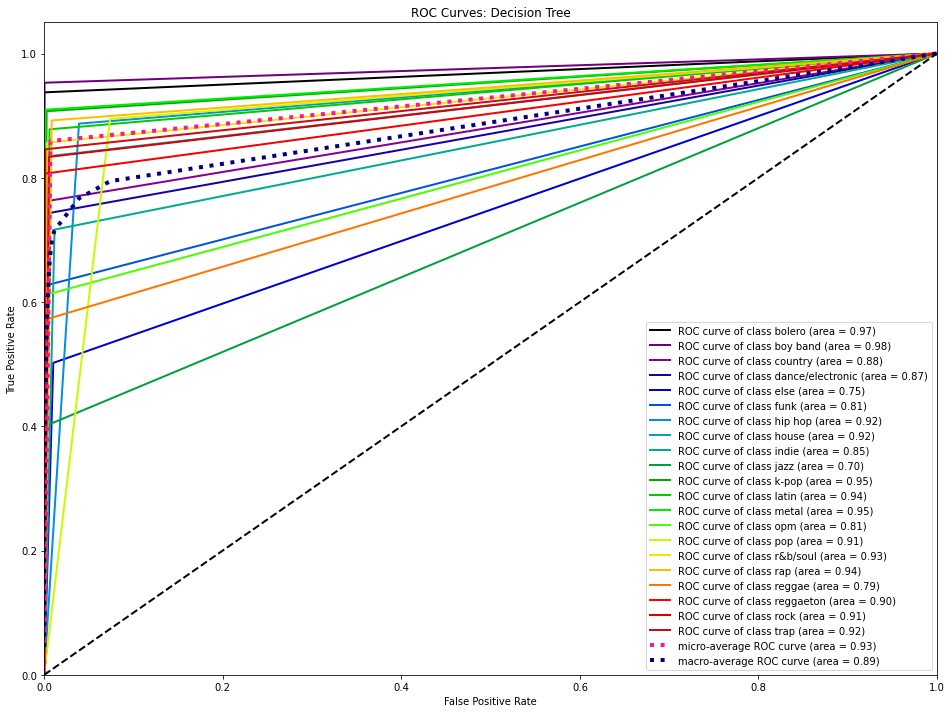

In [218]:
import scikitplot as skplt
import matplotlib.pyplot as plt

#pipe.fit(x_train, y_train)
y_probas = pipe.predict_proba(x_val)
skplt.metrics.plot_roc_curve(y_val, y_probas, figsize=(16, 12), title='ROC Curves: Decision Tree')
plt.show()

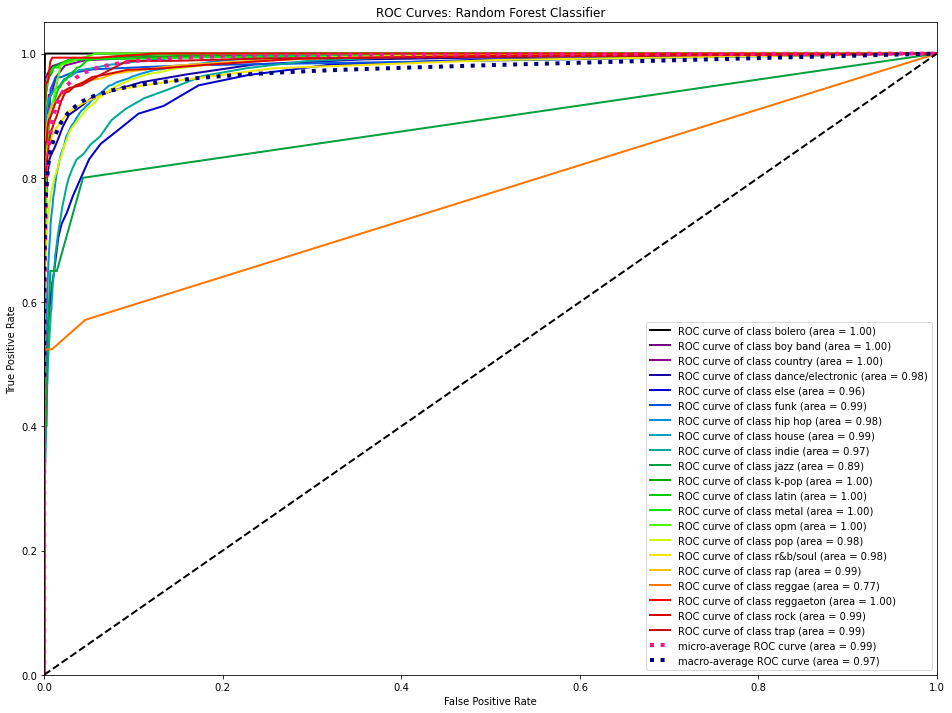

In [203]:
import scikitplot as skplt
import matplotlib.pyplot as plt

# pipe.fit(x_train, y_train)
y_probas = pipe.predict_proba(x_val)
skplt.metrics.plot_roc_curve(y_val, y_probas, figsize=(
    16, 12), title='ROC Curves: Random Forest Classifier')
plt.show()


In [204]:
print("Random Forest Classifier Model:")
predictions = evaluate(pipe, x_val, y_val)
pipe


Random Forest Classifier Model:
Model Performance
                  precision    recall  f1-score   support

          bolero       0.96      0.69      0.80        32
        boy band       1.00      0.88      0.94       298
         country       0.98      0.61      0.75       105
dance/electronic       0.97      0.69      0.81       862
            else       0.94      0.45      0.60       723
            funk       0.92      0.61      0.73       158
         hip hop       0.84      0.93      0.88      5371
           house       0.99      0.85      0.91       707
           indie       0.86      0.55      0.67      1101
            jazz       0.50      0.05      0.09        20
           k-pop       0.98      0.85      0.91       679
           latin       0.89      0.88      0.89      1451
           metal       0.94      0.92      0.93       354
             opm       0.79      0.43      0.55        54
             pop       0.82      0.97      0.89      9003
        r&b/soul     

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'release_type',
                                                   'explicit', 'cluster'])])),
                ('classifier', RandomForestClassifier())])

In [139]:
print("Logistic Regression Model: With subgenre")
predictions = evaluate(pipe, x_val, y_val)
pipe

Logistic Regression Model: With subgenre
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      1.00      1.00        32
        boy band       1.00      1.00      1.00       298
         country       1.00      0.97      0.99       105
dance/electronic       1.00      0.99      1.00       863
            else       0.98      0.98      0.98       723
            funk       1.00      0.98      0.99       158
         hip hop       1.00      1.00      1.00      5370
           house       1.00      0.99      1.00       707
           indie       1.00      0.99      1.00      1101
            jazz       1.00      0.80      0.89        20
           k-pop       1.00      1.00      1.00       679
           latin       1.00      1.00      1.00      1451
           metal       1.00      1.00      1.00       355
             opm       1.00      1.00      1.00        54
             pop       1.00      1.00      1.00      9003
        r&b/

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'release_type',
                                                   'explicit', 'sub_genre',
                                                   'cluster'])])),
                ('classifier', LogisticRegression())])

In [107]:
print("Random Forest Classifier Model:")
predictions = evaluate(pipe, x_val, y_val)
pipe

Random Forest Classifier Model:
Model Performance
                  precision    recall  f1-score   support

          bolero       1.00      0.88      0.93        32
        boy band       1.00      0.91      0.95       298
         country       0.99      0.63      0.77       105
dance/electronic       0.99      0.72      0.83       863
            else       0.93      0.48      0.64       723
            funk       0.93      0.63      0.75       158
         hip hop       0.84      0.92      0.88      5370
           house       0.99      0.85      0.91       707
           indie       0.84      0.53      0.65      1101
            jazz       1.00      0.05      0.10        20
           k-pop       0.96      0.88      0.92       679
           latin       0.90      0.91      0.90      1451
           metal       0.95      0.89      0.92       355
             opm       0.79      0.48      0.60        54
             pop       0.83      0.97      0.89      9003
        r&b/soul     

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'release_type',
                                                   'explicit', 'cluster'])])),
                ('classifier', RandomForestClassifier())])

In [165]:
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, make_scorer

# Variables for average classification report
originalclass = []
predictedclass = []
i = 42

#Make our customer score

def classification_report_with_accuracy_score(y_true, y_pred):
    originalclass.extend(y_true)
    predictedclass.extend(y_pred)
    return accuracy_score(y_true, y_pred)  # return accuracy score


inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=i)
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=i)

# Non_nested parameter search and scoring
# clf = GridSearchCV(estimator=svr, param_grid=p_grid, cv=inner_cv, verbose=1)

# Nested CV with parameter optimization
nested_score = cross_val_score(pipe, X=x_train, y=y_train, cv=outer_cv, scoring=make_scorer(
    classification_report_with_accuracy_score))
print(nested_score)

# Average values in classification report for all folds in a K-fold Cross-validation
print(classification_report(originalclass, predictedclass, digits=3))
# Print pipeline
pipe

[0.91695235 0.91724877 0.91682023 0.91836297 0.91694879]
                  precision    recall  f1-score   support

          bolero      0.873     0.966     0.917       149
        boy band      0.905     0.964     0.933      1388
         country      0.856     0.790     0.822       490
dance/electronic      0.868     0.839     0.853      4026
            else      0.827     0.669     0.739      3373
            funk      0.841     0.740     0.788       736
         hip hop      0.918     0.951     0.935     25063
           house      0.903     0.850     0.876      3299
           indie      0.917     0.828     0.870      5137
            jazz      0.898     0.468     0.615        94
           k-pop      0.941     0.949     0.945      3168
           latin      0.888     0.934     0.910      6773
           metal      0.966     0.956     0.961      1655
             opm      0.850     0.722     0.781       252
             pop      0.909     0.954     0.931     42014
        r&b/so

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', MinMaxScaler(),
                                                  ['popularity',
                                                   'artist_followers',
                                                   'danceability', 'energy',
                                                   'loudness', 'speechiness',
                                                   'acoustics',
                                                   'instrumentalness',
                                                   'liveness', 'valence',
                                                   'tempo', 'duration_min']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['country', 'artist',
                                                   'release_type', 'album',
                                                   'cluster'])])),
                ('classifier', KNeighborsClassifier())])